## Import CliMAF

In [1]:
from climaf.api import *

Climaf version = 1.2.8
Cache directory set to : /data/jservon/climafcache (use $CLIMAF_CACHE if set) 
Cache directory for remote data set to : /data/jservon/climafcache/remote_data (use $CLIMAF_REMOTE_CACHE if set) 
Available macros read from ~/.climaf.macros are : []


## The example we will illustrate here is:
- make a CMIP5 multi-model ensemble of historical runs
- make a CMIP6 IPSL-CM6A-LR ensemble of historical runs with the thirty members
- compute the climatologies and regrid all the members on the same regular grid
- find a member that has an error and exclude it from the ensemble
- compute the ensemble means
- get a reference (observations) for tos
- compute the ensemble mean bias maps
- and plot them

## First, build the CMIP5 multi-model ensemble
- request of all the models
- check what is available with explore('choices') to ensure we have only one attribut with multiple choices
- and build the ensemble with explore('ensemble')

In [2]:
req_cmip5 = ds(project='CMIP5',
               variable='tos',
               period='2000',
               experiment='historical',
               frequency='monthly',
               model='*',
               version='latest'
              )
req_cmip5.explore('choices')

{'model': ['ACCESS1-0',
  'ACCESS1-3',
  'CESM1-CAM5-1-FV2',
  'IPSL-CM5B-LR',
  'GFDL-ESM2M',
  'CMCC-CMS',
  'HadCM3',
  'MIROC-ESM',
  'HadGEM2-ES',
  'CanESM2',
  'FGOALS-s2',
  'MPI-ESM-P',
  'MRI-ESM1',
  'MPI-ESM-MR',
  'CSIRO-Mk3-6-0',
  'CESM1-BGC',
  'HadGEM2-AO',
  'inmcm4',
  'CESM1-FASTCHEM',
  'GISS-E2-R-CC',
  'BNU-ESM',
  'CNRM-CM5-2',
  'FGOALS-g2',
  'GFDL-CM2p1',
  'GFDL-ESM2G',
  'CMCC-CM',
  'EC-EARTH',
  'CanCM4',
  'CCSM4',
  'NorESM1-M',
  'CESM1-WACCM',
  'IPSL-CM5A-MR',
  'IPSL-CM5A-LR',
  'GFDL-CM3',
  'GISS-E2-H',
  'MIROC-ESM-CHEM',
  'MRI-CGCM3',
  'NorESM1-ME',
  'MIROC5',
  'GISS-E2-R',
  'HadGEM2-CC',
  'GISS-E2-H-CC',
  'CMCC-CESM',
  'bcc-csm1-1-m',
  'MPI-ESM-LR',
  'bcc-csm1-1',
  'CESM1-CAM5'],
 'realm': 'ocean',
 'table': 'Omon'}

### Ok we have the list of models; no other attribute has several values

### Let's build the ensemble and check the files associated with the members with summary()

In [3]:
ens_cmip5 = req_cmip5.explore('ensemble')
summary(ens_cmip5)

Keys - values:
{'domain': 'global', 'realm': 'ocean', 'version': 'latest', 'period': 2000, 'simulation': '', 'project': 'CMIP5', 'experiment': 'historical', 'frequency': 'monthly', 'realization': 'r1i1p1', 'variable': 'tos', 'table': 'Omon', 'model': 'ACCESS1-0', 'root': '/prodigfs/project'}
-- Ensemble members:
ACCESS1-0
/prodigfs/project/CMIP5/output/CSIRO-BOM/ACCESS1-0/historical/mon/ocean/Omon/r1i1p1/latest/tos/tos_Omon_ACCESS1-0_historical_r1i1p1_185001-200512.nc
--
ACCESS1-3
/prodigfs/project/CMIP5/output/CSIRO-BOM/ACCESS1-3/historical/mon/ocean/Omon/r1i1p1/latest/tos/tos_Omon_ACCESS1-3_historical_r1i1p1_185001-200512.nc
--
CESM1-CAM5-1-FV2
/prodigfs/project/CMIP5/output/NSF-DOE-NCAR/CESM1-CAM5-1-FV2/historical/mon/ocean/Omon/r1i1p1/latest/tos/tos_Omon_CESM1-CAM5-1-FV2_historical_r1i1p1_185001-200512.nc
--
IPSL-CM5B-LR
/prodigfs/project/CMIP5/output/IPSL/IPSL-CM5B-LR/historical/mon/ocean/Omon/r1i1p1/latest/tos/tos_Omon_IPSL-CM5B-LR_historical_r1i1p1_185001-200512.nc
--
GFDL-ESM2M

## Now do the same with the CMIP6 IPSL-CM6A-LR grand ensemble with realization='*'

In [4]:
req_cmip6 = ds(project='CMIP6',
               experiment='historical',
               model='IPSL-CM6A-LR',
               period='2000',
               variable='tos',
               table='Omon',
               realization='*'
              )
req_cmip6.explore('choices')

{'grid': 'gn',
 'institute': 'IPSL',
 'mip': 'CMIP',
 'realization': ['r10i1p1f1',
  'r14i1p1f1',
  'r29i1p1f1',
  'r20i1p1f1',
  'r16i1p1f1',
  'r21i1p1f1',
  'r11i1p1f1',
  'r6i1p1f1',
  'r1i1p1f1',
  'r3i1p1f1',
  'r7i1p1f1',
  'r28i1p1f1',
  'r22i1p1f1',
  'r5i1p1f1',
  'r23i1p1f1',
  'r13i1p1f1',
  'r2i1p1f1',
  'r8i1p1f1',
  'r19i1p1f1',
  'r26i1p1f1',
  'r9i1p1f1',
  'r18i1p1f1',
  'r27i1p1f1',
  'r17i1p1f1',
  'r24i1p1f1',
  'r4i1p1f1',
  'r31i1p1f1',
  'r30i1p1f1',
  'r25i1p1f1',
  'r15i1p1f1',
  'r12i1p1f1']}

In [5]:
ens_cmip6 = req_cmip6.explore('ensemble')
summary(ens_cmip6)

Keys - values:
{'domain': 'global', 'version': 'latest', 'institute': 'IPSL', 'realization': 'r10i1p1f1', 'period': 2000, 'simulation': '', 'project': 'CMIP6', 'experiment': 'historical', 'grid': 'gn', 'table': 'Omon', 'variable': 'tos', 'mip': 'CMIP', 'model': 'IPSL-CM6A-LR', 'root': '/bdd'}
-- Ensemble members:
r10i1p1f1
/bdd/CMIP6/CMIP/IPSL/IPSL-CM6A-LR/historical/r10i1p1f1/Omon/tos/gn/latest/tos_Omon_IPSL-CM6A-LR_historical_r10i1p1f1_gn_185001-201412.nc
--
r14i1p1f1
/bdd/CMIP6/CMIP/IPSL/IPSL-CM6A-LR/historical/r14i1p1f1/Omon/tos/gn/latest/tos_Omon_IPSL-CM6A-LR_historical_r14i1p1f1_gn_185001-201412.nc
--
r29i1p1f1
/bdd/CMIP6/CMIP/IPSL/IPSL-CM6A-LR/historical/r29i1p1f1/Omon/tos/gn/latest/tos_Omon_IPSL-CM6A-LR_historical_r29i1p1f1_gn_185001-201412.nc
--
r20i1p1f1
/bdd/CMIP6/CMIP/IPSL/IPSL-CM6A-LR/historical/r20i1p1f1/Omon/tos/gn/latest/tos_Omon_IPSL-CM6A-LR_historical_r20i1p1f1_gn_185001-201412.nc
--
r16i1p1f1
/bdd/CMIP6/CMIP/IPSL/IPSL-CM6A-LR/historical/r16i1p1f1/Omon/tos/gn/latest/t

### Compute annual mean climatology of each member on both ensembles

In [6]:
anm_ens_cmip5 = clim_average(ens_cmip5,'ANM')

anm_ens_cmip6 = clim_average(ens_cmip6,'ANM')

### Regrid over the same regular grid

In [7]:
rgrd_anm_ens_cmip5 = regridn(anm_ens_cmip5,
                             cdogrid='r360x180')
rgrd_anm_ens_cmip6 = regridn(anm_ens_cmip6,
                             cdogrid='r360x180')

## And compute the ensemble mean with ccdo_ens(..., operator='ensavg')

In [8]:
ensmean_cmip5 = ccdo_ens(rgrd_anm_ens_cmip5,
                         operator='ensavg')
ensmean_cmip6 = ccdo_ens(rgrd_anm_ens_cmip6,
                         operator='ensavg')

### Get some observations

In [9]:
ref = ds(project='ref_climatos', variable='tos',
         product='WOA13-v2').explore('resolve')

summary(ref)

/data/jservon/Evaluation/ReferenceDatasets/climatos/ocn/mo/tos/WOA13-v2/ac/tos_Omon_WOA13-v2_observations_195501-201212-clim.nc


{'clim_period': '195501-201212',
 'domain': 'global',
 'frequency': 'annual_cycle',
 'obs_type': 'observations',
 'period': fx,
 'product': 'WOA13-v2',
 'project': 'ref_climatos',
 'simulation': 'refproduct',
 'table': 'Omon',
 'variable': 'tos'}

### Regrid the reference as well after computing the climatology

In [10]:
rgrd_ref = regridn(clim_average(ref,'ANM'),
                   cdogrid='r360x180')

### Plot the ensemble mean for CMIP6 to check if the result is ok
Reminder:
- plot() is the basic CliMAF plot operator
- iplot() is a layer on top of plot used to display a CliMAF plot in a Notebook; use => iplot(plot(dat, ...))
- implot() can be used directly in notebooks to both do the plot and display it; use => implot(dat, ...)

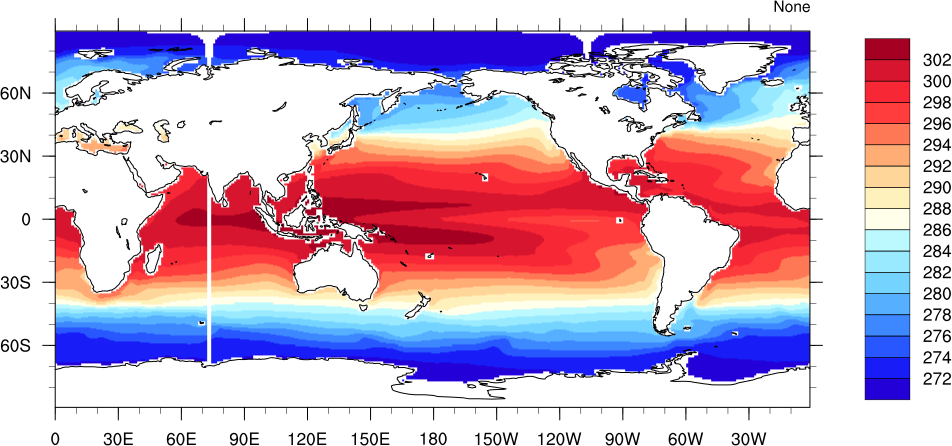

In [11]:
implot(ensmean_cmip6)

### Same for CMIP5

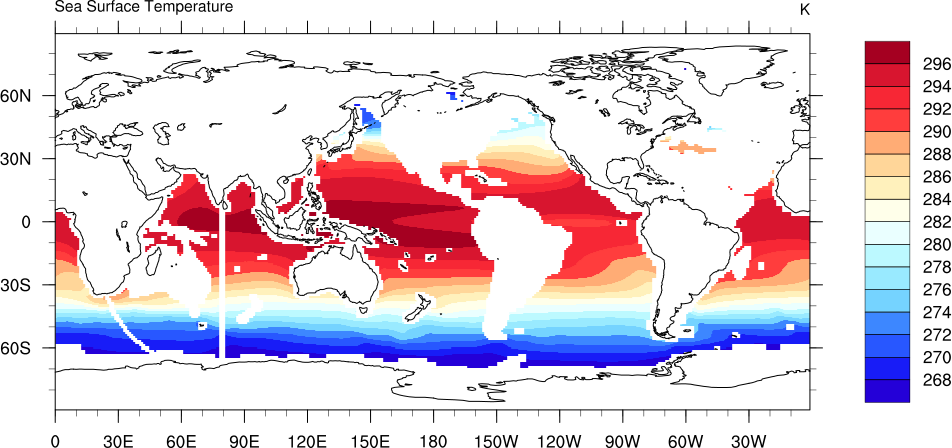

In [12]:
implot(ensmean_cmip5)

## Ooops, we have a problem...
There is obviously a problem with one (or more) of the members of the ensemble.

Here is a way to display the members one by one

### Plot a first series of 12 plots with iplot_members => N = 1

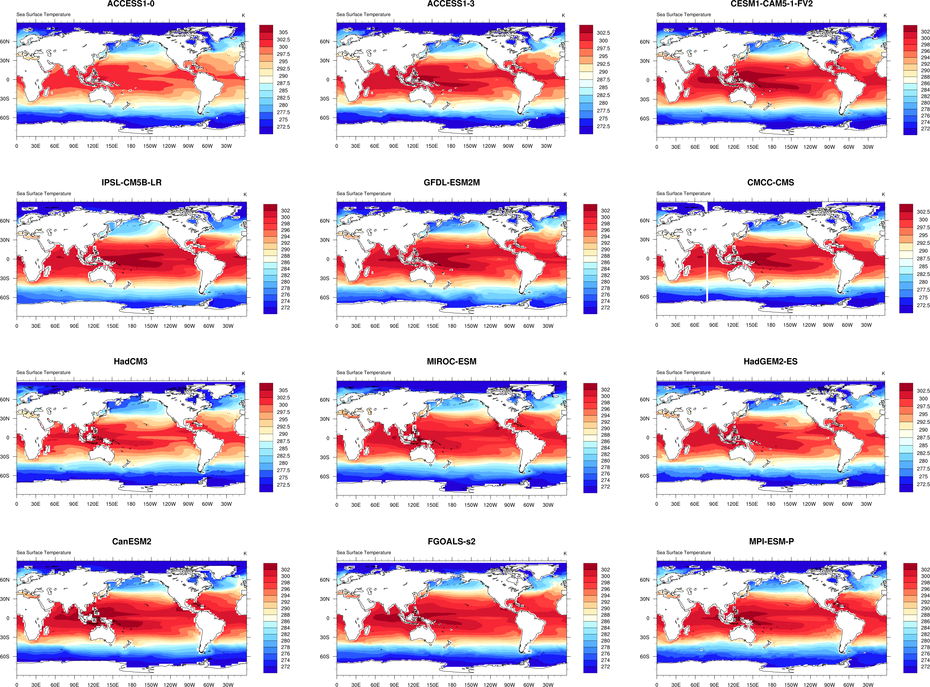

In [13]:
iplot_members(rgrd_anm_ens_cmip5, N=1)

### For a better tracking of the errors, specify:
- focus = 'ocean' (to focus on the ocean only)
- min, max and delta to give boundaries to levels of values (and track potential problems of units)

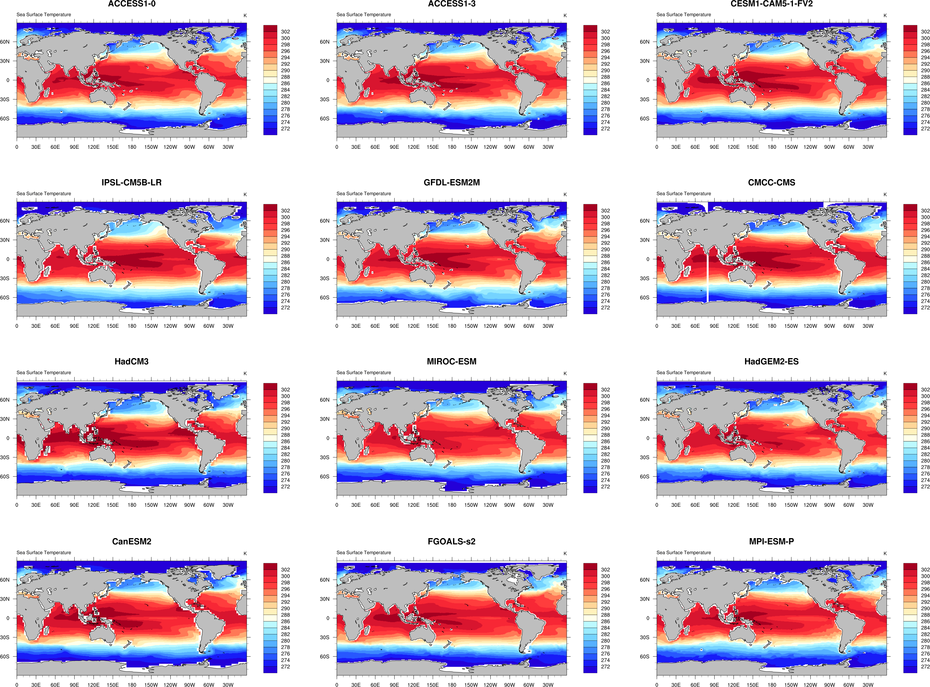

In [14]:
iplot_members(rgrd_anm_ens_cmip5, N=1, focus='ocean', min=272, max=302, delta=2)

### This one looks ok. 

### Plot the next series of 12 plots in the ensemble => N = 1

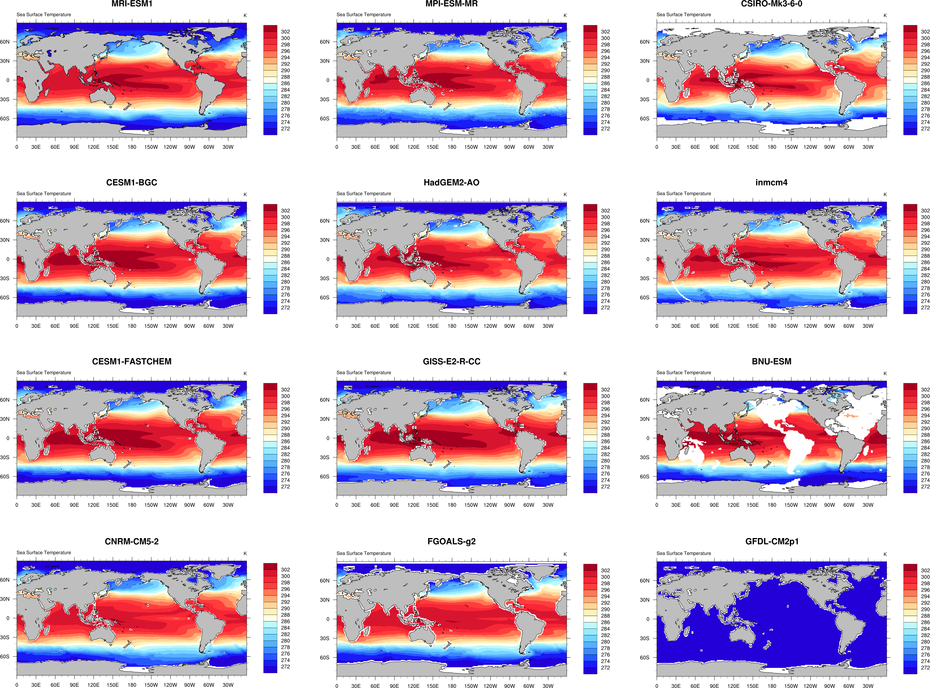

In [16]:
iplot_members(rgrd_anm_ens_cmip5, N=2, focus='ocean', min=272, max=302, delta=2)

### Obviously BNU-ESM and GFDL-CM2p1 have issues.

### We will remove BNU-ESM and add an offset to GFDL-CM2p1 to convert it from celsius to kelvin

In [17]:
# -- Make a copy of the original ensemble
ok_rgrd_anm_ens_cmip5 = rgrd_anm_ens_cmip5.copy()

# -- Remove BNU-ESM
ok_rgrd_anm_ens_cmip5.pop('BNU-ESM')

# -- Add 273.15 to GFDL-CM2p1 (Celsius to Kelvin)
ok_rgrd_anm_ens_cmip5['GFDL-CM2p1'] = fadd(rgrd_anm_ens_cmip5['GFDL-CM2p1'], 273.15)

# -- Might not have seen that, but MIROC5 mask over continents was set to zero; set it to missing value
#    with cdo setctomiss,0
ok_rgrd_anm_ens_cmip5['MIROC5'] = ccdo(rgrd_anm_ens_cmip5['MIROC5'], operator='setctomiss,0')

### Check that your corrections are effective:

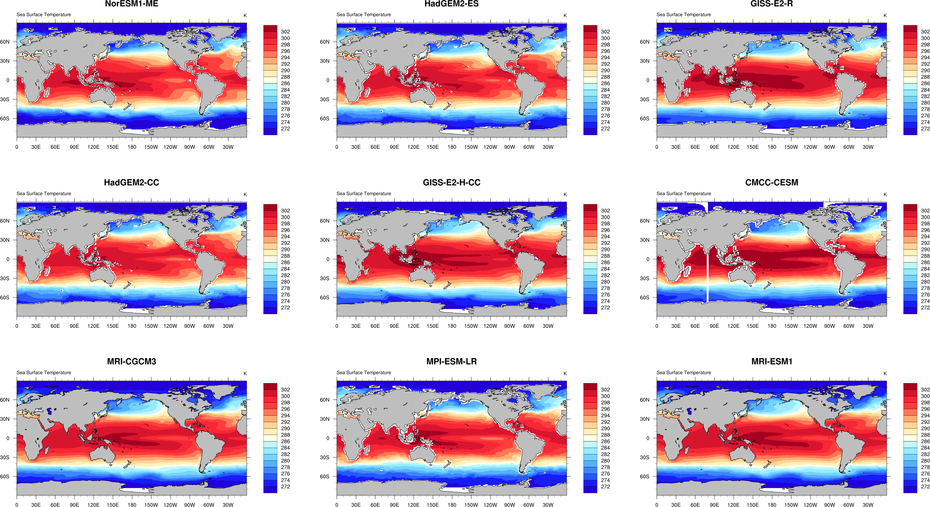

In [33]:
iplot_members(ok_rgrd_anm_ens_cmip5, N=4, focus='ocean', min=272, max=302, delta=2)

### And make another clean ensemble mean

In [34]:
ok_ensmean_cmip5 = ccdo_ens(ok_rgrd_anm_ens_cmip5, operator='ensavg')

## The CMIP5 ensemble mean is now set properly.

### Let's compute the bias of the ensemble mean for both ensembles with minus()

In [35]:
bias_ensmean_cmip6 = minus(ensmean_cmip6, rgrd_ref)
bias_ensmean_cmip5 = minus(ok_ensmean_cmip5, rgrd_ref)

### And plot them:
- one by one first
- then in a multiplot

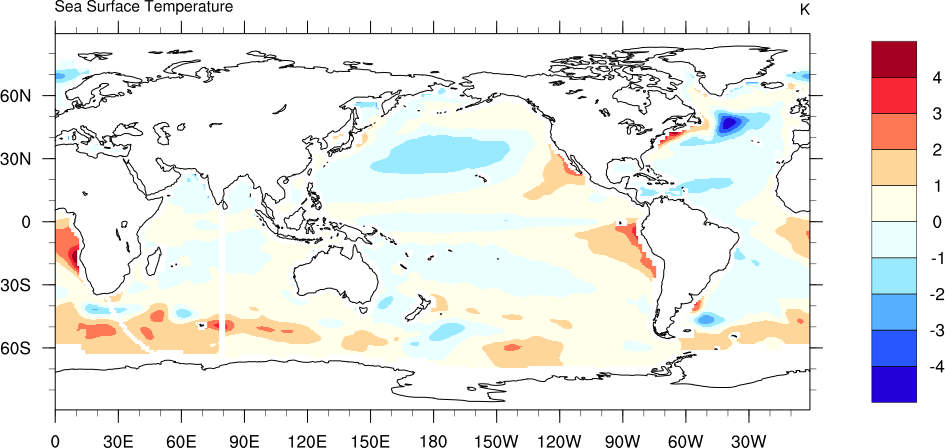

In [37]:
implot(bias_ensmean_cmip5)

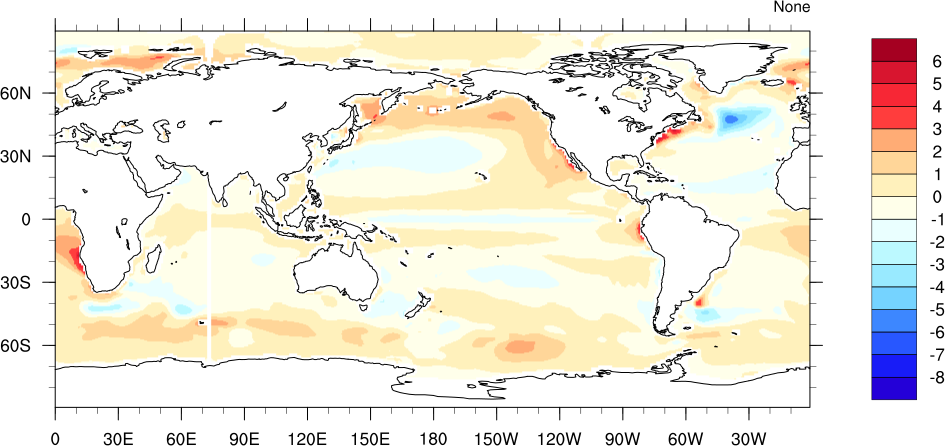

In [38]:
implot(bias_ensmean_cmip6)

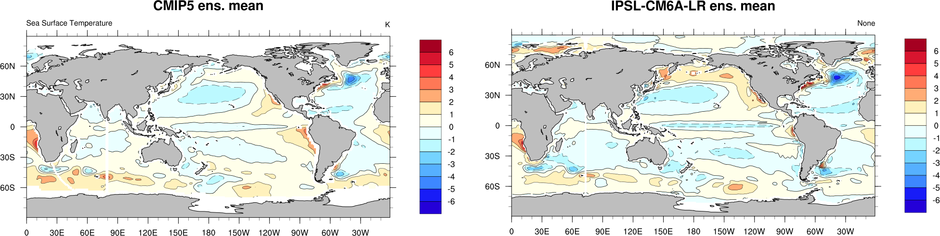

In [39]:
# -- Start by making two plots with plot() !! not iplot() !!
cmip5_plot = plot(bias_ensmean_cmip5, focus='ocean', title='CMIP5 ens. mean',
                  min=-6, max=6, delta=1, contours=1)
cmip6_plot = plot(bias_ensmean_cmip6, focus='ocean', title='IPSL-CM6A-LR ens. mean',
                  min=-6, max=6, delta=1, contours=1)

# -- Make the multiplot with cpage()
mp = cpage(fig_lines=[[cmip5_plot,cmip6_plot]])

# -- And display the result in the notebook with iplot
iplot(mp)

### Just for fun: add two plots with polar stereographic projections:

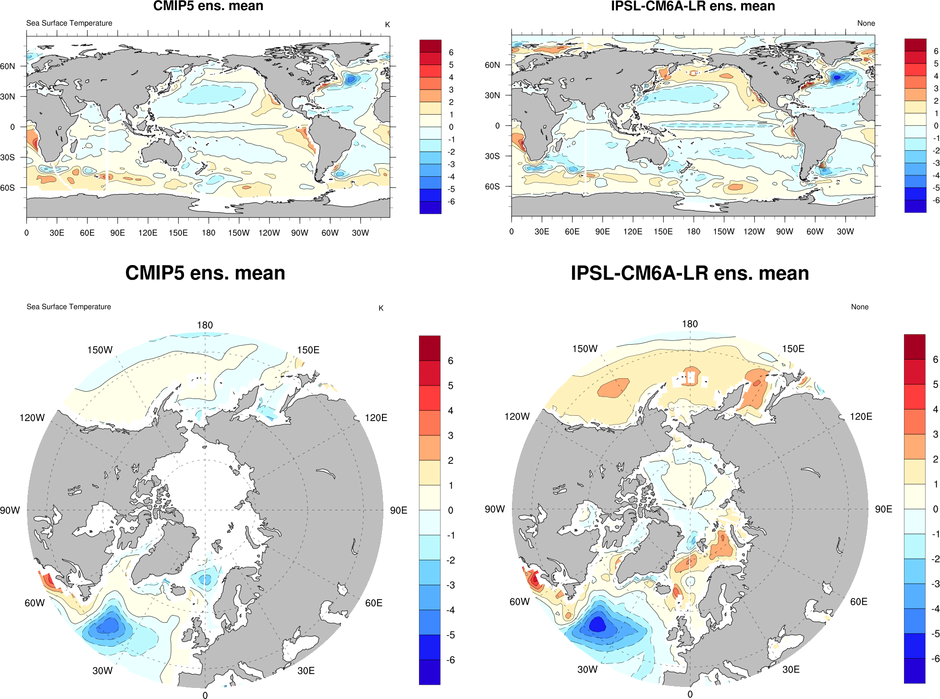

In [40]:
NH_cmip5_plot = plot(bias_ensmean_cmip5, focus='ocean', title='CMIP5 ens. mean',
                     min=-6, max=6, delta=1, contours=1,
                     proj='NH40')
NH_cmip6_plot = plot(bias_ensmean_cmip6, focus='ocean', title='IPSL-CM6A-LR ens. mean',
                     min=-6, max=6, delta=1, contours=1,
                     proj='NH40')

# -- Make the multiplot with cpage()
mp = cpage(fig_lines=[ [cmip5_plot,cmip6_plot], [NH_cmip5_plot, NH_cmip6_plot]])

# -- And display the result in the notebook with iplot
iplot(mp)

### Tip: how to get help on cpage?

In [41]:
help(cpage)

Help on class cpage in module climaf.classes:

class cpage(cobject)
 |  Methods defined here:
 |  
 |  __init__(self, fig_lines=None, widths=None, heights=None, fig_trim=True, page_trim=True, format='png', orientation=None, page_width=1000.0, page_height=1500.0, title='', x=0, y=26, ybox=50, pt=24, font='Times-New-Roman', gravity='North', background='white')
 |      Builds a CliMAF cpage object, which represents an array of figures (output:
 |      'png' or 'pdf' figure)
 |      
 |      Args:
 |      
 |        fig_lines (a list of lists of figure objects or an ensemble of figure objects):
 |         each sublist of 'fig_lines' represents a line of figures   
 |        widths (list, optional): the list of figure widths, i.e. the width of each 
 |         column. By default, if fig_lines is:
 |         
 |           - a list of lists: spacing is even
 |           - an ensemble: one column is used
 |        heights (list, optional): the list of figure heights, i.e. the
 |         height

### That's it for this last hour of the CliMAF training session of November 19 - Convergence - CLIMERI!

### See more on the CliMAF frontpage:
Here:
https://climaf.readthedocs.io/en/master/#can-climaf-make-my-scientific-life-easier

And here:
https://climaf.readthedocs.io/en/master/#cmip6-cmip5-climeri-convergence-training-session-november-19-2018

### and don't forget to subscribe to climaf@meteo.fr